# Imports

In [1]:
import numpy as np
from agent import RL_Agent_v1
from env_versions import env_v1, env_v2, env_v3
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

import time
import sys
from tqdm.notebook import tqdm


## Rendering

In [2]:
def render(episode, env):
    
    fig = plt.figure()
    img = plt.imshow(env.draw())
    plt.axis('off')

    def animate(i):
        img.set_data(episode[i])
        return img,

    anim = FuncAnimation(fig, animate, frames=len(episode), interval=100, blit=True)
    html = HTML(anim.to_jshtml())
    
    plt.close(fig)
    # os.remove(None0000000.png)
    
    return html

def render_to_video(episode, env, save_file = 'random.gif', fps = 10):
    
    fig = plt.figure()
    img = plt.imshow(env.draw())
    plt.axis('off')

    def animate(i):
        img.set_data(episode[i])
        return img,

    anim = FuncAnimation(fig, animate, frames=len(episode), interval=100, blit=True)
    Writer = animation.writers['ffmpeg']
    writer = Writer(fps=fps, metadata=dict(artist='Me'), bitrate=1800)

    anim.save(save_file, writer=writer)
    
    plt.close(fig)
    # os.remove(None0000000.png)

def run_fixed_episode(env, agent, max_steps = 99, init_state = 1):
    frames = []
    env.reset()
    done = False
    total_reward = 0
    state = np.concatenate( (env.air_hockey.ball_pos, env.air_hockey.ball_vel, env.air_hockey.self_hand_pos)  )
    for i in range(max_steps):
        observation = env.draw()
        frames.append( observation )
        action = agent.get_action( state )
        state, reward, done, __ = env.step(action)
        total_reward += reward
        if done:
            break
    return frames, total_reward
    
%matplotlib inline
plt.rcParams['figure.figsize'] = 5, 5
plt.rcParams["animation.html"] = "jshtml"


In [3]:
#filler
def dist( pos1, pos2 ):
    return np.linalg.norm( pos1-pos2 )

def ball_out( ball_pose, env ):
    return (ball_pose[0] < env.air_hockey.ball_radious or ball_pose[0] > env.x_width-env.air_hockey.ball_radious or
            ball_pose[1] < env.air_hockey.ball_radious or ball_pose[1] > env.y_heigth-env.air_hockey.ball_radious)
def ball_ok(ball_pose, self_pose, enemy_pose, env):
    return (dist( ball_pose, self_pose ) > env.air_hockey.hand_radious + env.air_hockey.ball_radious and
            dist( ball_pose, enemy_pose ) > env.air_hockey.hand_radious + env.air_hockey.ball_radious)

def fill_buffer(agent, env, buffer_length):
    for i in tqdm(range(buffer_length)):
        ball_pose = np.array( [np.random.rand()*(env.x_width-2*env.air_hockey.ball_radious)+env.air_hockey.ball_radious
                , np.random.rand()*(env.y_heigth-2*env.air_hockey.ball_radious)+env.air_hockey.ball_radious] )
        self_pose = np.array( [np.random.rand()*(env.x_width-2*env.air_hockey.hand_radious)+env.air_hockey.hand_radious, 
            np.random.rand()*(env.y_heigth/2-2*env.air_hockey.hand_radious)+env.air_hockey.hand_radious] )
        enemy_pose = np.array( [np.random.rand()*(env.x_width-2*env.air_hockey.hand_radious)+env.air_hockey.hand_radious, 
            np.random.rand()*(env.y_heigth/2-2*env.air_hockey.hand_radious)+env.air_hockey.hand_radious+env.y_heigth/2] )
        
        while( not ball_ok(ball_pose, self_pose, enemy_pose, env) ):
            ball_pose = np.array( [np.random.rand()*(env.x_width-2*env.air_hockey.ball_radious)+env.air_hockey.ball_radious
                , np.random.rand()*(env.y_heigth-2*env.air_hockey.ball_radious)+env.air_hockey.ball_radious] )
        env.reset(ball_pos = ball_pose, self_pos = self_pose, enemy_pos = enemy_pose)
        state = np.concatenate( (env.air_hockey.ball_pos, env.air_hockey.ball_vel, env.air_hockey.self_hand_pos)  )
        action = agent.get_action(state, 1)
        new_state, reward, done, _ = env.step(action)
        agent.memory.push( state, action, done, new_state, reward )


def fill_collision_buffer(agent, env, buffer_length):
    for i in tqdm(range(buffer_length)):
        self_pose = np.array( [np.random.rand()*(env.x_width-2*env.air_hockey.hand_radious)+env.air_hockey.hand_radious, 
            np.random.rand()*(env.y_heigth/2-2*env.air_hockey.hand_radious)+env.air_hockey.hand_radious] )
        enemy_pose = [np.random.rand()*(env.x_width-2*env.air_hockey.hand_radious)+env.air_hockey.hand_radious, 
            np.random.rand()*(env.y_heigth/2-2*env.air_hockey.hand_radious)+env.air_hockey.hand_radious+env.y_heigth/2]
        ball_pose = np.zeros(2) 
        while( np.linalg.norm(self_pose-ball_pose) > 0.45 or ball_out( ball_pose, env ) or 
            not ball_ok(ball_pose, self_pose, enemy_pose, env)  ):
            ball_pose = self_pose + np.random.rand(2)*0.3
        env.reset(ball_pos = ball_pose, self_pos = self_pose, enemy_pos = enemy_pose)
        state = np.concatenate( (env.air_hockey.ball_pos, env.air_hockey.ball_vel, env.air_hockey.self_hand_pos)  )
        action = agent.get_action(state, 1)
        new_state, reward, done, _ = env.step(action)
        agent.memory.push( state, action, done, new_state, reward )

def train_filled(agent, n_steps, batch_size, show_each = -1):
    start_time = time.time()
    loss_track = []
    if(show_each < 0): show_each = n_steps
    for i in tqdm(range(n_steps)):
        loss_track.append( agent.learn(batch_size) )
        if( (i+1)%show_each==0 ):
            print( "step "+str(i) +" execution time "+str(time.time()-start_time) )    

    plt.plot( np.log(loss_track) )
    plt.xlabel( "training_steps" )
    plt.ylabel( "log loss" )
    return loss_track

## Train function

In [4]:
def train_v1(env, agent, max_episode_num = 5000, max_steps = 99, save_file = "RL_agent",
             e_greedy = -1, e_max = 1, e_min = 0.5, e_decay_rate = 0.01, clip_update = 10, show_every = 10, save_every = 10):
    start_time = time.time()
    all_rewards = []
    # optimizer = optim.RMSprop(agent.parameters())
    for episode in range(max_episode_num):
        env.reset()
        rewards = []
        state = np.concatenate( (env.air_hockey.ball_pos, env.air_hockey.ball_vel, env.air_hockey.self_hand_pos)  )
        if(e_greedy != -1):
            e_greedy = e_min + (e_max - e_min)*np.exp(-e_decay_rate*episode)

        for steps in range(max_steps):
            action = agent.get_action(state, e_greedy)
            new_state, reward, done, _ = env.step(action)
            rewards.append(reward)
            agent.step( state, action, done, new_state, reward )
            if done:
                break
            state = new_state
        all_rewards.append(np.sum(rewards))
        
        if (episode+1) % show_every == 0:
            sys.stdout.write("episode: {}, total reward: {}, last_average_reward: {}, time: {}\n".format(episode, np.round(np.sum(rewards), decimals = 3),  
                    np.round(np.mean(all_rewards[-10:]), decimals = 3), time.time()-start_time))
            
        if ( episode+1 ) % save_every == 0:        # update the clipped
            agent.save_model(save_file)

        if ( episode+1 ) % clip_update == 0:        # update the clipped
            agent.clipped.load_state_dict( agent.agent.state_dict() )


    plt.figure()
    plt.subplot(111)
    plt.plot(all_rewards)
    plt.xlabel('Episode')
    plt.ylabel('Rewards')
    plt.show()


# Training

## First try

In [5]:
env = env_v1()
agent = RL_Agent_v1()

In [6]:
episode, total_reward = run_fixed_episode(env, agent)
print(total_reward)
render(episode, env)

-1045


episode: 24, total reward: 306, last_average_reward: -277.8, time: 49.98340821266174
episode: 49, total reward: 1820, last_average_reward: -891.4, time: 101.96069264411926
episode: 74, total reward: 896, last_average_reward: -53.4, time: 155.43532991409302
episode: 99, total reward: -816, last_average_reward: -58.0, time: 208.31404280662537
episode: 124, total reward: -642, last_average_reward: -814.8, time: 261.5706031322479
episode: 149, total reward: 2990, last_average_reward: 972.8, time: 313.4710922241211
episode: 174, total reward: 28, last_average_reward: 1058.2, time: 364.6380286216736
episode: 199, total reward: 516, last_average_reward: 79.6, time: 416.0138969421387
episode: 224, total reward: 588, last_average_reward: -310.6, time: 469.074490070343
episode: 249, total reward: 2492, last_average_reward: 630.0, time: 520.4945363998413
episode: 274, total reward: 72, last_average_reward: -251.6, time: 575.6057043075562
episode: 299, total reward: -2360, last_average_reward: -77

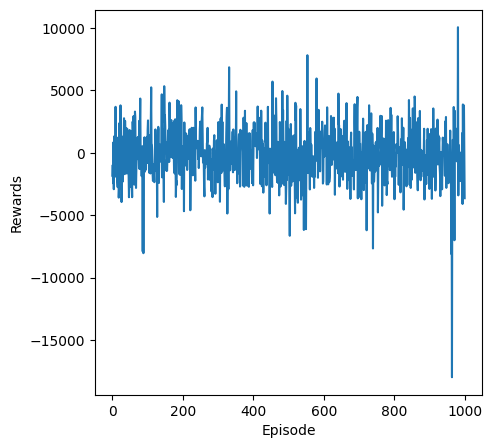

-644


In [7]:
train_v1(env, agent, max_episode_num = 1000, max_steps = 1000, save_file = "DQN_v1",
            e_greedy = 1, e_max = 1, e_min = 0.1, e_decay_rate = 0.01, show_every = 25, save_every = 100, clip_update=10)

episode, total_reward = run_fixed_episode(env, agent, max_steps = 1000, init_state = 1)
print(total_reward)
render(episode, env)

## Second try

Firstly fill a diverse buffer and train over there

In [3]:
env = env_v1()
agent = RL_Agent_v1(memory_capacity=10000)

In [5]:
fill_buffer(agent, env, int(agent.memory_capacity/2))
print( "done" )
fill_collision_buffer(agent, env, int(agent.memory_capacity/2))
print( "done" )

# train_filled(agent, 10, 64)



  0%|          | 0/5000 [00:00<?, ?it/s]

done


  0%|          | 0/5000 [00:00<?, ?it/s]

done


  0%|          | 0/10000 [00:00<?, ?it/s]

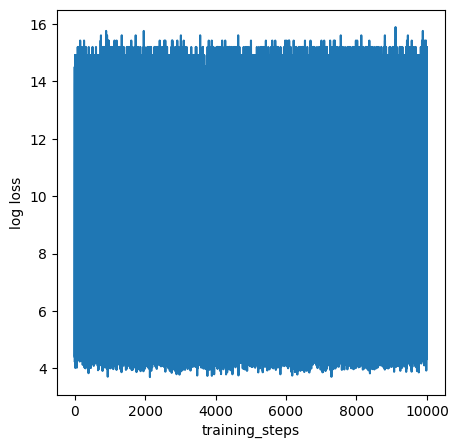

In [16]:
train_filled(agent, 10000, 64)


  0%|          | 0/1000000 [00:00<?, ?it/s]

step 4999 execution time 18.676024675369263
step 9999 execution time 39.94655966758728
step 14999 execution time 63.277376890182495
step 19999 execution time 82.47371172904968
step 24999 execution time 101.36012959480286
step 29999 execution time 120.6417088508606
step 34999 execution time 138.73956871032715
step 39999 execution time 156.8968915939331
step 44999 execution time 176.13181710243225
step 49999 execution time 193.5642488002777
step 54999 execution time 212.2698929309845
step 59999 execution time 230.06727957725525
step 64999 execution time 246.94937705993652
step 69999 execution time 264.5528426170349
step 74999 execution time 280.6416482925415
step 79999 execution time 296.6179287433624
step 84999 execution time 313.0160377025604
step 89999 execution time 329.90114665031433
step 94999 execution time 349.98018860816956
step 99999 execution time 370.7078330516815
step 104999 execution time 393.56136202812195
step 109999 execution time 415.78534483909607
step 114999 execution

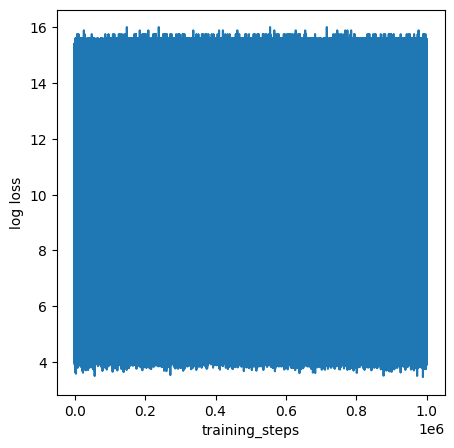

In [9]:
agent.save_memory( 'memory_buffer_2' )
agent.save_model( 'post_training_DQN_2' )
train_filled(agent, 1000000, 64)
agent.save_model( 'post_training_DQN_2' )

In [11]:
agent.save_model( 'post_training_DQN_2' )


In [19]:
agent2 = RL_Agent_v1(memory_capacity=10000, learning_rate=1e-4)
agent2.load_memory('memory_buffer_2')
agent2.load_model('post_training_DQN_2')
episode, total_reward = run_fixed_episode(env, agent)
print(total_reward)
render(episode, env)

1971


tensor([[ 0.5427,  0.0802,  0.9612, -1.0539, -0.4437, -0.3569, -0.4840,  0.4457,
          0.2719,  0.2552,  0.0047,  0.0058, -0.6686,  0.1216, -0.1001, -0.6382,
          0.2768]], grad_fn=<AddmmBackward0>)


  0%|          | 0/10000000 [00:00<?, ?it/s]

step 49999 execution time 158.04357862472534
step 99999 execution time 308.70996618270874
step 149999 execution time 463.85214018821716
step 199999 execution time 614.1132431030273
step 249999 execution time 764.9177775382996
step 299999 execution time 915.2158811092377
step 349999 execution time 1065.7549595832825
step 399999 execution time 1215.6340928077698
step 449999 execution time 1365.8256752490997
step 499999 execution time 1516.3951103687286
step 549999 execution time 1665.824301481247
step 599999 execution time 1815.108082294464
step 649999 execution time 1964.8180613517761
step 699999 execution time 2114.532889842987
step 749999 execution time 2263.9287462234497
step 799999 execution time 2413.4793977737427
step 849999 execution time 2562.758420228958
step 899999 execution time 2712.589332342148
step 949999 execution time 2861.757049560547
step 999999 execution time 3011.090740919113
step 1049999 execution time 3160.4548802375793
step 1099999 execution time 3309.788152456283

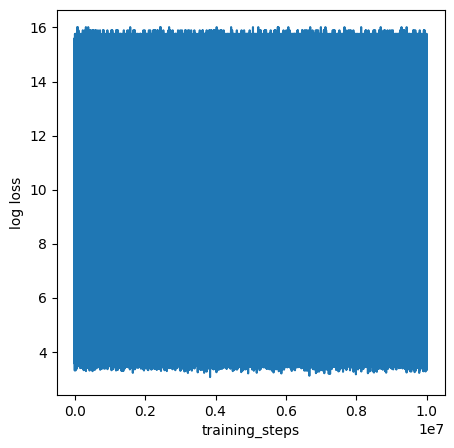

In [20]:
print( agent2.agent.forward( [2,3,0,0,2,1] ) )
train_filled(agent2, 10000000, batch_size=64, show_each=50000)
print( agent2.agent.forward( [2,3,0,0,2,1] ) )


In [21]:
agent2.save_model( 'post_training_DQN_2' )


In [22]:
episode, total_reward = run_fixed_episode(env, agent)
print(total_reward)
render(episode, env)

11


In [24]:
render_to_video(episode, env, 'trained_DQN.gif')

## Try 3

  0%|          | 0/5000 [00:00<?, ?it/s]

done


  0%|          | 0/5000 [00:00<?, ?it/s]

done
tensor([[-0.2767,  0.0934, -0.0766,  0.1610, -0.0212, -0.2716,  0.3384,  0.2260,
          0.3224,  0.3066,  0.0658, -0.0666,  0.0738,  0.1510,  0.1794,  0.2156,
          0.0682]], grad_fn=<AddmmBackward0>)


  0%|          | 0/1000000 [00:00<?, ?it/s]

step 49999 execution time 147.12177515029907
step 99999 execution time 299.7783877849579
step 149999 execution time 484.17719435691833
step 199999 execution time 671.4650316238403
step 249999 execution time 858.5880844593048
step 299999 execution time 1077.689337015152
step 349999 execution time 1281.710192680359
step 399999 execution time 1491.9911708831787
step 449999 execution time 1683.581190109253
step 499999 execution time 1874.7118978500366
step 549999 execution time 2065.2957677841187
step 599999 execution time 2255.7310547828674
step 649999 execution time 2446.7973849773407
step 699999 execution time 2637.2100689411163
step 749999 execution time 2827.1222088336945
step 799999 execution time 3020.937598466873
step 849999 execution time 3212.362548828125
step 899999 execution time 3402.4829981327057
step 949999 execution time 3590.88090634346
step 999999 execution time 3779.9586300849915
tensor([[3.9092, 2.8984, 3.0607, 2.9330, 3.5533, 3.4608, 2.8903, 3.5127, 3.3470,
         2.

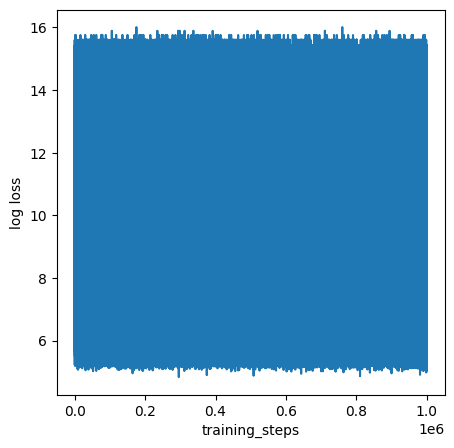

In [5]:
env = env_v2()
agent = RL_Agent_v1(memory_capacity=10000, learning_rate=1e-2)
fill_buffer(agent, env, int(agent.memory_capacity/2))
print( "done" )
fill_collision_buffer(agent, env, int(agent.memory_capacity/2))
print( "done" )

agent.save_memory('memory_buffer_3')
agent.save_model('post_training_DQN_3')

print( agent.agent.forward( [2,3,0,0,2,1] ) )
train_filled(agent, 1000000, batch_size=64, show_each=50000)
print( agent.agent.forward( [2,3,0,0,2,1] ) )

agent.save_model('post_training_DQN_3')

episode, total_reward = run_fixed_episode(env, agent)
print(total_reward)
render_to_video(episode, env, 'trained_DQN_env2.gif')
render(episode, env)

tensor([[-0.0493,  0.1935, -0.1634, -0.0930, -0.1643,  0.2900,  0.0588,  0.0114,
         -0.0829, -0.2380,  0.1689,  0.1767, -0.0375, -0.2074,  0.1710,  0.1208,
         -0.1799]], grad_fn=<AddmmBackward0>)
episode: 24, total reward: 333, last_average_reward: -14.7, time: 152.8419680595398
episode: 49, total reward: 391, last_average_reward: 939.1, time: 349.04213762283325
episode: 74, total reward: 1000, last_average_reward: 812.9, time: 542.1880655288696
episode: 99, total reward: -502, last_average_reward: 514.4, time: 741.9698286056519


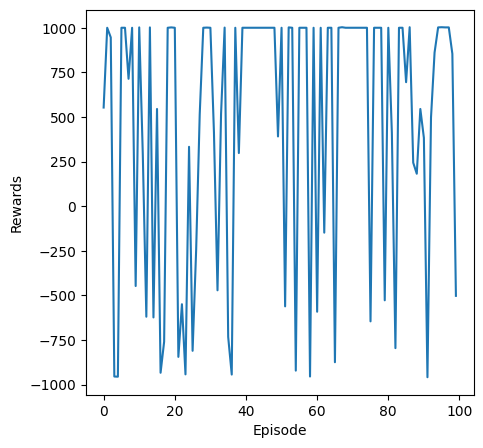

tensor([[7.6242, 7.7033, 7.6570, 7.7080, 7.5841, 7.6265, 7.6015, 7.6359, 7.6323,
         7.7419, 7.7246, 7.7592, 7.5493, 7.6977, 7.7080, 7.7742, 7.6461]],
       grad_fn=<AddmmBackward0>)
1000


In [5]:
env = env_v3()
agent = RL_Agent_v1(memory_capacity=10000, learning_rate=1e-2)
agent.save_memory('memory_buffer_4')
agent.save_model('post_training_DQN_4')

print( agent.agent.forward( [2,3,0,0,2,1] ) )
train_v1(env, agent, max_episode_num = 50, max_steps = 1000, save_file = "post_training_DQN_4",
            e_greedy = 1, e_max = 1, e_min = 0.1, e_decay_rate = 0.01, show_every = 25, save_every = 100, clip_update=10)

agent.save_model('post_training_DQN_4')
print( agent.agent.forward( [2,3,0,0,2,1] ) )
episode, total_reward = run_fixed_episode(env, agent, max_steps = 1000, init_state = 1)
print(total_reward)
render(episode, env)

In [8]:
print( agent.agent.forward( [2,5.99,0,0,2,1] ) )
print( agent.agent.forward( [2,4.99,0,0,2,1] ) )
print( agent.agent.forward( [2,3.99,0,0,2,1] ) )


tensor([[7.6242, 7.7033, 7.6570, 7.7080, 7.5841, 7.6265, 7.6015, 7.6359, 7.6323,
         7.7419, 7.7246, 7.7592, 7.5493, 7.6977, 7.7080, 7.7742, 7.6461]],
       grad_fn=<AddmmBackward0>)
tensor([[7.6242, 7.7033, 7.6570, 7.7080, 7.5841, 7.6265, 7.6015, 7.6359, 7.6323,
         7.7419, 7.7246, 7.7592, 7.5493, 7.6977, 7.7080, 7.7742, 7.6461]],
       grad_fn=<AddmmBackward0>)
tensor([[7.6242, 7.7033, 7.6570, 7.7080, 7.5841, 7.6265, 7.6015, 7.6359, 7.6323,
         7.7419, 7.7246, 7.7592, 7.5493, 7.6977, 7.7080, 7.7742, 7.6461]],
       grad_fn=<AddmmBackward0>)


In [4]:
import torch
import torch.nn.functional as F
env = env_v2()
agent = RL_Agent_v1(memory_capacity=10000, learning_rate=1e-2)
agent.load_memory('memory_buffer_3')
agent.load_model('post_training_DQN_3')


In [7]:
import torch
import torch.nn.functional as F
input = torch.tensor( [2,3.99,0,0,2,1], dtype=torch.float32, device=torch.device("cpu") )
x = agent.agent.linear1(input)
print( x )
x = F.relu(x)
print( x )
x = agent.agent.linear2(x)
print( x )
x = F.relu(x)
print( x )
x = agent.agent.linear3(x)
print( x )

tensor([-3.4827e+00, -3.0720e-01, -4.1125e+00, -1.1156e+00, -4.2996e+00,
        -3.4961e+00, -6.9292e-01, -2.4582e+00, -1.0348e+00, -3.6175e-01,
        -1.6729e+00, -2.7162e+00, -6.2008e-01, -1.2056e+00, -1.9481e+00,
        -2.7957e+00, -4.9874e+00, -1.3178e+00, -1.1242e+00, -1.5918e+00,
        -2.8230e+00, -3.5696e+00, -3.0873e+00, -1.6839e+00, -2.1508e+00,
        -2.5281e+00, -8.3179e-01, -3.1275e+00, -5.2569e+00, -3.6300e+00,
        -1.8043e+00, -3.0492e+00, -2.5916e+00, -4.1903e+00, -5.9126e-01,
        -3.6326e+00, -4.0369e+00, -3.2884e+00, -5.5948e+00, -1.3872e+00,
        -2.6276e+00, -3.7151e+00, -2.1960e+00, -7.8008e-02, -1.3602e+00,
        -1.0405e+00, -3.0397e+00, -1.5539e+00, -1.4731e+00, -3.2303e-01,
        -1.4543e+00, -3.4081e+00, -2.1197e+00, -2.6744e+00, -6.3961e-01,
        -3.1356e+00, -3.3440e+00,  5.0901e-02, -1.5249e+00, -1.5578e+00,
        -3.3770e+00, -1.0003e+00, -3.5144e+00, -3.2104e+00, -6.3952e-01,
        -1.6968e+00, -9.4241e-01, -2.3052e+00, -2.7

In [6]:

print( agent.agent.forward( [2,5.99,0,0,2,1] ) )
print( agent.agent.forward( [2,4.99,0,0,2,1] ) )
print( agent.agent.forward( [2,3.99,0,0,2,1] ) )

tensor([[3.9092, 2.8984, 3.0607, 2.9330, 3.5533, 3.4608, 2.8903, 3.5127, 3.3470,
         2.9008, 3.1696, 3.2384, 3.3930, 3.4797, 3.4119, 3.6690, 3.1808]],
       grad_fn=<AddmmBackward0>)
tensor([[3.9092, 2.8984, 3.0607, 2.9330, 3.5533, 3.4608, 2.8903, 3.5127, 3.3470,
         2.9008, 3.1696, 3.2384, 3.3930, 3.4797, 3.4119, 3.6690, 3.1808]],
       grad_fn=<AddmmBackward0>)
tensor([[3.9092, 2.8984, 3.0607, 2.9330, 3.5533, 3.4608, 2.8903, 3.5127, 3.3470,
         2.9008, 3.1696, 3.2384, 3.3930, 3.4797, 3.4119, 3.6690, 3.1808]],
       grad_fn=<AddmmBackward0>)


In [19]:
episode, total_reward = run_fixed_episode(env, agent)
print(total_reward)
# render_to_video(episode, env, 'trained_DQN_env2.gif')
render(episode, env)

175.7265053246798


tensor([[-0.1680,  0.0777, -0.0130, -0.0227, -0.0924, -0.0767, -0.3267, -0.0772,
         -0.1533,  0.0332,  0.0565, -0.0918,  0.0082, -0.0728, -0.0988, -0.0961,
          0.1203]], grad_fn=<AddmmBackward0>)


  0%|          | 0/100000 [00:00<?, ?it/s]

step 49999 execution time 110.38406348228455
step 99999 execution time 247.34394145011902
tensor([[3.1915, 3.2798, 2.9660, 3.2883, 3.3608, 3.6031, 3.1123, 3.6184, 3.0554,
         3.0377, 3.0538, 3.1731, 3.5113, 3.2466, 3.4744, 3.2214, 3.2562]],
       grad_fn=<AddmmBackward0>)


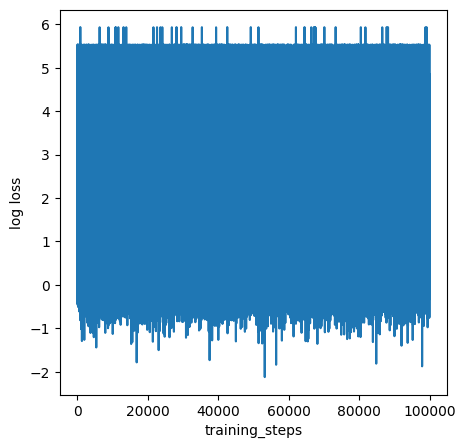

In [31]:
import torch
import torch.nn.functional as F
env = env_v2()
agent = RL_Agent_v1(memory_capacity=10000, learning_rate=1e-2)
agent.load_memory('memory_buffer_3')
agent.criterion = torch.nn.SmoothL1Loss(reduction='mean')
from collections import namedtuple
Transition = namedtuple('Transition',
                        ('state', 'action', 'done', 'next_state', 'reward'))

print( agent.agent.forward( [2,3,0,0,2,1] ) )
loss = train_filled(agent, 100000, batch_size=8, show_each=50000)
print( agent.agent.forward( [2,3,0,0,2,1] ) )


  0%|          | 0/500 [00:00<?, ?it/s]

done


  0%|          | 0/500 [00:00<?, ?it/s]

done
tensor([[ 0.0722, -0.2361, -0.3079, -0.0956,  0.2645, -0.2624,  0.1931,  0.1313,
          0.1765,  0.1374,  0.1045, -0.0592, -0.1375, -0.1501, -0.1756,  0.0317,
          0.0447]], grad_fn=<AddmmBackward0>)


  0%|          | 0/100000 [00:00<?, ?it/s]

step 49999 execution time 94.88187909126282
step 99999 execution time 206.71923875808716
tensor([[2.4089, 2.2478, 1.9784, 2.2726, 2.2945, 2.3189, 1.8862, 2.5467, 2.2848,
         2.0476, 2.4240, 2.3629, 2.4989, 2.4726, 2.1893, 2.0311, 1.8609]],
       grad_fn=<AddmmBackward0>)


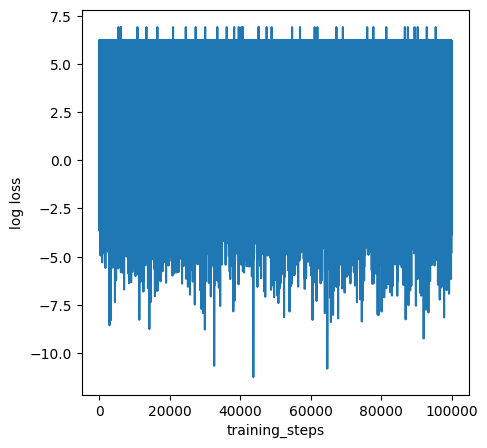

In [7]:
import torch
import torch.nn.functional as F
env = env_v3()
agent = RL_Agent_v1(memory_capacity=1000, learning_rate=1e-2)
agent.load_memory('memory_buffer_3')
agent.criterion = torch.nn.SmoothL1Loss(reduction='mean')
from collections import namedtuple
Transition = namedtuple('Transition',
                        ('state', 'action', 'done', 'next_state', 'reward'))

fill_buffer(agent, env, int(agent.memory_capacity/2))
print( "done" )
fill_collision_buffer(agent, env, int(agent.memory_capacity/2))
print( "done" )

agent.save_memory('memory_buffer_4')
agent.save_model('post_training_DQN_4')

print( agent.agent.forward( [2,3,0,0,2,1] ) )
loss = train_filled(agent, 100000, batch_size=2, show_each=50000)
print( agent.agent.forward( [2,3,0,0,2,1] ) )
agent.save_model('post_training_DQN_4')


In [10]:
loss

[tensor(3.2696),
 tensor(5.0919),
 tensor(2.2560),
 tensor(4.2933),
 tensor(2.0492),
 tensor(8.8894),
 tensor(6.3268),
 tensor(6.4013),
 tensor(6.7480),
 tensor(2.0171),
 tensor(2.1822),
 tensor(2.9846),
 tensor(5.2968),
 tensor(0.0257),
 tensor(4.5456),
 tensor(4.1073),
 tensor(4.5494),
 tensor(3.6462),
 tensor(4.8192),
 tensor(501.9892),
 tensor(1.9425),
 tensor(1.6967),
 tensor(3.1192),
 tensor(1.7166),
 tensor(4.3003),
 tensor(0.6830),
 tensor(1.1850),
 tensor(1.0642),
 tensor(0.0528),
 tensor(499.9347),
 tensor(4.6888),
 tensor(0.8930),
 tensor(4.8234),
 tensor(3.5319),
 tensor(2.9089),
 tensor(2.5721),
 tensor(0.2649),
 tensor(0.7666),
 tensor(0.9714),
 tensor(1.8678),
 tensor(0.7208),
 tensor(12.0737),
 tensor(0.9020),
 tensor(2.3541),
 tensor(4.7732),
 tensor(1.4765),
 tensor(0.9508),
 tensor(0.1699),
 tensor(1.8417),
 tensor(3.9704),
 tensor(3.8399),
 tensor(4.5132),
 tensor(5.6194),
 tensor(4.3900),
 tensor(0.9890),
 tensor(1.3767),
 tensor(9.1269),
 tensor(2.9645),
 tensor(3

In [27]:
self = agent
# agent.load_model('post_training_DQN_3')
batch_size = 8
for i in range(5000):
    transitions = self.memory.sample(batch_size)
    batch = Transition(*zip(*transitions))      # array of transitions -> transition of arrays
    states_batch = torch.tensor( np.array(batch.state), dtype=self.dtype, device=self.device, requires_grad=False )
    done_mask = torch.tensor(batch.done, requires_grad=False)

    state_action_values = self.agent.forward( states_batch ).gather(1, torch.tensor( [batch.action], device=self.device, requires_grad=False) )
    not_done_next_state = torch.tensor(  np.array([ batch.next_state[i] for i in range(batch_size) if not done_mask[i] ]), dtype=torch.float32, device=self.device, requires_grad=False )

    with torch.no_grad():
        next_state_values = torch.zeros( batch_size, device = self.device, requires_grad=False, dtype=self.dtype )
        next_state_values[ torch.logical_not( done_mask ) ] = self.clipped.forward( not_done_next_state ).max(1)[0].detach()
        expected_state_action_values = (next_state_values * self.gamma) + torch.tensor(batch.reward, device=self.device, requires_grad=False, dtype=self.dtype)

    loss = self.criterion(state_action_values, expected_state_action_values.unsqueeze(0))
    self.optimizer.zero_grad()
    loss.backward()
    for param in self.agent.parameters():       # clip the range of the gradients
        param.grad.data.clamp_(-100, 100)
    self.optimizer.step()
    print(loss)

tensor(7016.0010, grad_fn=<MseLossBackward0>)
tensor(12957.3428, grad_fn=<MseLossBackward0>)
tensor(31359.6797, grad_fn=<MseLossBackward0>)
tensor(7886.4800, grad_fn=<MseLossBackward0>)
tensor(9682.3008, grad_fn=<MseLossBackward0>)
tensor(31167.8066, grad_fn=<MseLossBackward0>)
tensor(23353.0762, grad_fn=<MseLossBackward0>)
tensor(47.9452, grad_fn=<MseLossBackward0>)
tensor(7830.5088, grad_fn=<MseLossBackward0>)
tensor(23459.0273, grad_fn=<MseLossBackward0>)
tensor(8043.6597, grad_fn=<MseLossBackward0>)
tensor(23925.9727, grad_fn=<MseLossBackward0>)
tensor(7815.8335, grad_fn=<MseLossBackward0>)
tensor(23377.0723, grad_fn=<MseLossBackward0>)
tensor(7742.9404, grad_fn=<MseLossBackward0>)
tensor(15681.9316, grad_fn=<MseLossBackward0>)
tensor(15588.1836, grad_fn=<MseLossBackward0>)
tensor(16441.1582, grad_fn=<MseLossBackward0>)
tensor(15863.0713, grad_fn=<MseLossBackward0>)
tensor(15466.3994, grad_fn=<MseLossBackward0>)
tensor(15328.0820, grad_fn=<MseLossBackward0>)
tensor(7903.8931, grad_

In [33]:
states_batch

tensor([[ 0.9738,  3.5215,  3.9551, -1.4822,  1.0572,  2.4324],
        [ 1.3750,  0.7392,  2.3190,  5.7655,  1.1840,  0.5562],
        [ 1.5035,  2.1807, -8.8617, -1.2107,  1.2353,  2.1490],
        [ 2.6719,  1.6386,  4.5503,  6.2198,  2.3917,  1.5567],
        [ 2.3409,  2.7999, -6.4095, -4.9761,  2.1531,  2.5246],
        [ 3.1092,  2.8121, -0.6500,  0.2383,  2.8541,  2.7512],
        [ 1.3121,  0.8867,  3.7423, -6.1860,  1.3044,  0.6175],
        [ 2.5511,  0.7665, -0.4915, -0.6446,  2.2576,  0.7553],
        [ 1.7309,  3.8958,  1.2988, -0.1257,  0.8525,  0.2019],
        [ 3.6166,  1.1432,  1.2878, -0.5208,  2.7065,  1.5885]])

In [11]:
not_done_next_state

tensor([[ 3.7400,  0.5818,  0.7792,  2.9562,  3.3062,  0.2585],
        [ 3.8292,  2.3820, -2.2777,  2.6537,  3.4699,  1.8120]])

In [12]:
next_state_values

tensor([0.2990, 0.3157])

In [15]:
print(state_action_values)
print(expected_state_action_values)

tensor([[-0.1188,  0.2987]], grad_fn=<GatherBackward0>)
tensor([5.1173, 4.4104])


In [7]:
loss

tensor(23323.0703, grad_fn=<MseLossBackward0>)

In [26]:
for param in self.agent.parameters():       # clip the range of the gradients
    print(param.grad.data)

tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        ...,
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0004,  0.0002, -0.0002,  0.0002,  0.0003,  0.0002],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000]])
tensor([ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         0.0000e+00,  1.6161e-04, -2.3087e-03, -2.4709e-05, -1.8700e-03,
         0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
        -1.7861e-03,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         0.0000e+00,  0.0000e+00, -2.2827e-03,  0.0000e+00, -2.2938e-03,
         0.0000e+00, -1.5692e-04,  0.0000e+00,  0.0000e+00, -2.9476e-03,
         0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -2.8150e-03,
         0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.1782e-04,
         0.0000e+0

In [18]:
for param in self.agent.parameters():       # clip the range of the gradients
    print(param.grad.data.shape)

torch.Size([256, 6])
torch.Size([256])
torch.Size([256, 256])
torch.Size([256])
torch.Size([17, 256])
torch.Size([17])


In [22]:
for param in self.agent.parameters():       # clip the range of the gradients
    print(param.data)

tensor([[-2.2931e-02, -1.3725e-01, -5.6713e-03,  1.6243e-02, -3.1686e-02,
         -4.5539e-01],
        [-7.4105e-01, -5.1687e-01,  5.7241e-02, -3.6437e-02, -6.9719e-01,
         -6.0951e-01],
        [-7.4557e-01, -1.0334e+00,  5.9696e-02,  5.6032e-02, -7.8419e-01,
         -3.1633e-01],
        ...,
        [-1.0302e-01, -3.5046e-01, -5.6147e-02, -5.2943e-03, -1.7133e-02,
         -6.1297e-01],
        [-6.3820e-01, -5.3201e-01,  7.4849e-02, -1.0388e-01, -5.6099e-01,
         -7.5277e-01],
        [-3.7624e-01, -4.6912e-01, -5.3174e-02, -5.1497e-04,  1.5131e-02,
         -6.2274e-01]])
tensor([-0.2591, -0.7897, -1.0477, -0.1973, -0.5769, -0.6715, -0.3468, -0.0477,
        -0.1056, -0.5561, -0.5627, -0.6291, -0.4452, -0.5704, -0.2252, -0.5030,
        -1.1299, -0.3969, -0.0754, -0.9994,  0.0765, -0.1420, -0.3357, -0.2336,
        -0.3093, -0.1279, -0.4087, -0.4775, -0.4140, -0.1025, -0.2513, -0.1777,
        -0.3387, -0.2237, -0.4024, -0.6921, -0.3534, -0.9371, -0.6232, -0.3085,
    

In [25]:
self.criterion

MSELoss()